In [92]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV, learning_curve, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_curve
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  

from IPython.display import Image  
import pydotplus

#%pip install imblearn 
from imblearn.over_sampling import SMOTE

#### Dataset for this project: https://www.kaggle.com/mlg-ulb/creditcardfraud

In [93]:
df = pd.read_csv("creditcard.csv")
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [94]:
len(df)

284807

In [95]:
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [96]:
#Check for missing values 
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

## Exploratory Data Analysis (EDA)

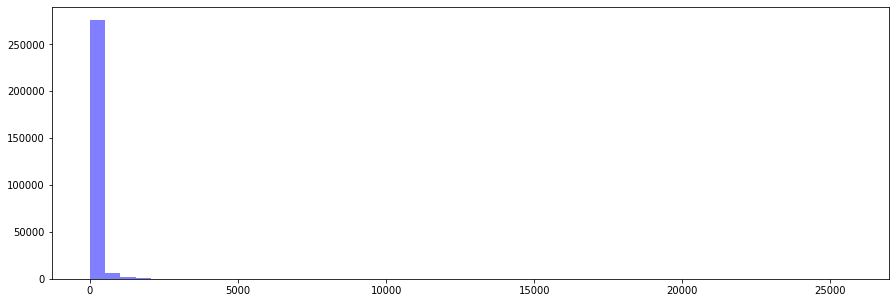

In [97]:
# Distribution of transaction amount

plt.figure(figsize=(15,5))
plt.hist(df['Amount'], 50, facecolor='blue', alpha=0.5)
plt.show()

The df.Amount column is heavily right skewed. It may need to be normalised in order for it to be useful in classification.

In [102]:
print(df['Amount'].describe())


count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64


Text(0.5, 1.0, '')

<Figure size 1080x360 with 0 Axes>

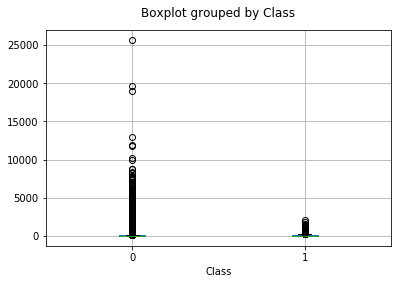

In [101]:
plt.figure(figsize=(15,5))
df.boxplot(column = ['Amount'],by='Class')
plt.title('')

There are a large number of outliers in the 'Amount' column, in both classes, which I have decided to keep for the analysis as it may be a good indicator of transaction fraud.

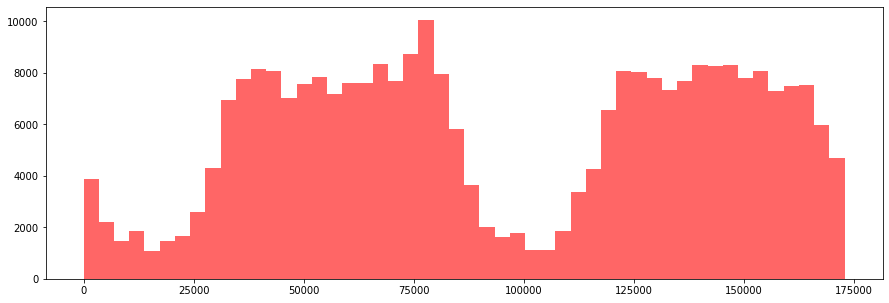

In [8]:
# Distribution of transaction amount
plt.figure(figsize=(15,5))
plt.hist(df['Time'], 50, facecolor='red', alpha=0.6)
plt.show()

The 'Time' column represents the time elapsed (seconds) from the earliest transaction in the dataset. The above plot has two peaks - showing that there was a significant drop in the transactions between 90,000-110,000. This possibly signifies the end of the first day (data covers two days).

0    284315
1       492
Name: Class, dtype: int64


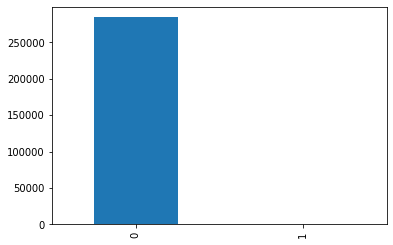

In [9]:
class_values = df['Class'].value_counts()
print(class_values)
class_values.plot.bar(x = class_values[0], y = class_values[1])


We do not have enough cases of fraudulant data, therefore we need to oversample that class using SMOTE.

In [10]:
print(df[df.columns].corr()['Class'][:].sort_values())

V17      -0.326481
V14      -0.302544
V12      -0.260593
V10      -0.216883
V16      -0.196539
V3       -0.192961
V7       -0.187257
V18      -0.111485
V1       -0.101347
V9       -0.097733
V5       -0.094974
V6       -0.043643
Time     -0.012323
V24      -0.007221
V13      -0.004570
V15      -0.004223
V23      -0.002685
V22       0.000805
V25       0.003308
V26       0.004455
Amount    0.005632
V28       0.009536
V27       0.017580
V8        0.019875
V20       0.020090
V19       0.034783
V21       0.040413
V2        0.091289
V4        0.133447
V11       0.154876
Class     1.000000
Name: Class, dtype: float64


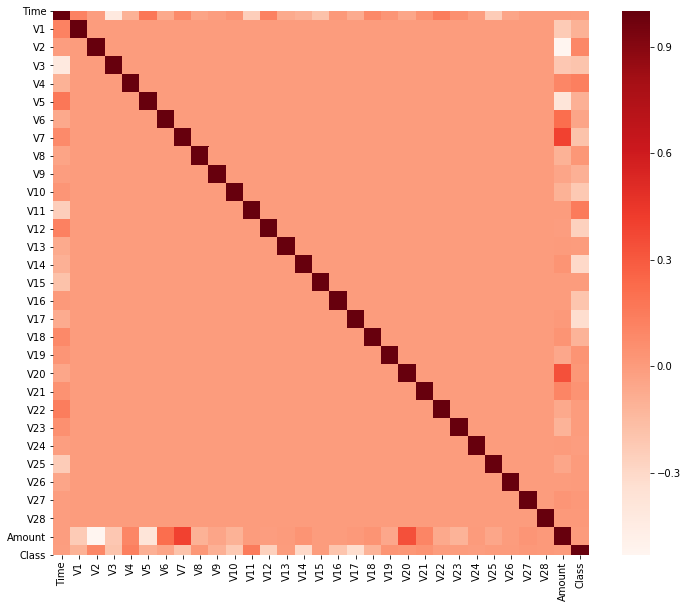

In [11]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, annot=False, cmap=plt.cm.Reds)
plt.show()

- Class has a particularly larger correlation with attributes V1-V18, compared to the rest of them.
- There is not significant multicollinearity between the different attributes of people (V columns).
- Time has very little relevance with the amount of spent.

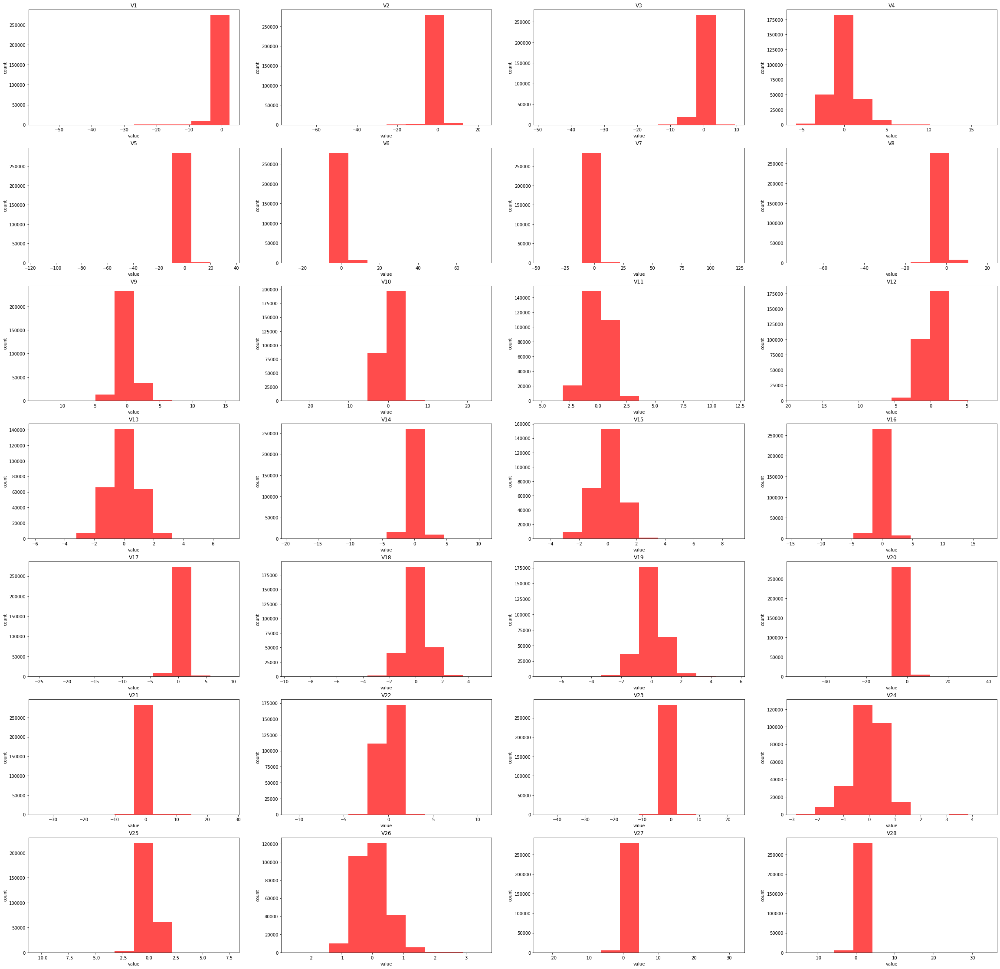

<Figure size 1440x720 with 0 Axes>

In [12]:
x = []
titles = []
for i in range(1, 29):
    x.append(df.iloc[:, i])
    titles.append(df.columns[i])
    
f,a = plt.subplots(nrows = 7, ncols = 4, figsize=(40, 40))
a = a.ravel()
for idx,ax in enumerate(a):
    ax.hist(x[idx], color = 'red', alpha =0.7)
    ax.set_title(titles[idx])
    ax.set_xlabel("value")
    ax.set_ylabel("count")
    
plt.figure(figsize=(20,10))
plt.tight_layout()


Above are the probability distribution curves for each V-value in the dataset. The probability distribution curve shows the probability of getting each value (in the x-axis). There are different types of probability distribution.
All the V-columns from the dataset are normally distributed. Some of the reasons normal distribution is important:

- Normal distribution is simple, and this simplicity makes it extremely popular.
- The characteristics of normal distributions are such that the accuracy of resulting predictions is much higher.
- A lot of methods are particularly applicable to normal data, so it helps if the data is normal.

All these variables most likely underwent Principal Component Analysis - as we don't know what they represent. One of the disadvantages of this is that it now makes it harder to interpret.
Even though some of these variables show very little correlation with the class variable, I'm going to go ahead and leave them in for now, and run the analysis after taking them out at a later stage to determine whether they are useful in any way.

### Optional transformation of 'Amount' variable

I have decided not to transform the amount of variables, as I believe it will not make a significant difference to the prediction accuracy.

In [13]:
# df_norm = pd.DataFrame(df)
# df_norm['Amount'] = np.log(df.Amount + 1)
# df_norm.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,5.014760,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,1.305626,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,5.939276,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,4.824306,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,4.262539,0


Now if the 'Amount' variable is visualised, it should have be normally distributed.

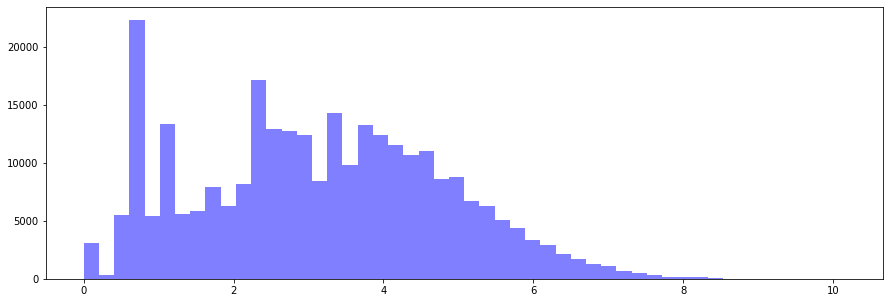

In [14]:
# Distribution of transaction amount

# plt.figure(figsize=(15,5))
# plt.hist(df_norm['Amount'], 50, facecolor='blue', alpha=0.5)
# plt.show()

## SMOTE

As mentioned earlier, the number of fraudulent classes, represented by '1' in the dataset, is signficantly less compared to the non-fraudulent cases. Therefore, I will use the oversampling method, SMOTE to generate more (synthetic) instances of fradulent instances, so there is no bias.

While SMOTE is a widely used technique to deal with class bias, it can lead to overfitting as new instances are generated based on the features of data in the training set, which may not occur in different data.

First I will train the data without applying SMOTE.

In [78]:
X = pd.DataFrame(df)
X = X.drop(columns=['Class'])
X = X.values

y = pd.DataFrame()
y['Class'] = df['Class']
y = y.values

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0) 

# describes info about train and test set 
print("Number transactions X_train dataset: ", X_train.shape) 
print("Number transactions y_train dataset: ", y_train.shape) 
print("Number transactions X_test dataset: ", X_test.shape) 
print("Number transactions y_test dataset: ", y_test.shape) 

Number transactions X_train dataset:  (199364, 30)
Number transactions y_train dataset:  (199364, 1)
Number transactions X_test dataset:  (85443, 30)
Number transactions y_test dataset:  (85443, 1)


In [75]:
logreg = LogisticRegression(n_jobs=1, C=1e5)
logreg.fit(X_train, y_train.ravel())

y_pred = logreg.predict(X_test)
y_pred_prob = logreg.predict_proba(X_test)[:, -1]

tags = ['0', '1']

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=tags))

accuracy 0.9991105181231933
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85296
           1       0.85      0.59      0.69       147

    accuracy                           1.00     85443
   macro avg       0.93      0.79      0.85     85443
weighted avg       1.00      1.00      1.00     85443



Even though the overall accuracy is staggeringly high at 99.9%, this is not a good model. The dataset contains so many '0' values in the class column, that even if the model were to predict '0' for all cases, the accuracy would still be high. As seen from the classification report, the **recall** value for '1' is very low.\
recall for '1' = (true '1') / (true '1' + false '0').

In [79]:
# sampling_strategy = 'desired ratio of minority class to majority class'

sm = SMOTE(sampling_strategy = 1, random_state = 1)
X, y = sm.fit_sample(X, y.ravel())

[284315 284315]


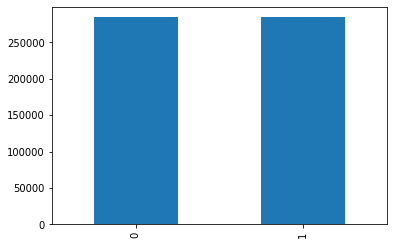

In [80]:
print(np.bincount(y))
final_class_count = pd.Series(np.bincount(y))

final_class_count.plot.bar(x = final_class_count[0], y = final_class_count[1])

Now that the classes are balanced, we will run the analysis again.

## Model 1: Logistic Regression

In [81]:
X_train_sm, X_test_sm, y_train_sm, y_test_sm = train_test_split(X, y, test_size = 0.4, random_state = 0) 
  
# describes info about train and test set 
print("Number transactions X_train dataset: ", X_train_sm.shape) 
print("Number transactions y_train dataset: ", y_train_sm.shape) 
print("Number transactions X_test dataset: ", X_test_sm.shape) 
print("Number transactions y_test dataset: ", y_test_sm.shape) 

Number transactions X_train dataset:  (341178, 30)
Number transactions y_train dataset:  (341178,)
Number transactions X_test dataset:  (227452, 30)
Number transactions y_test dataset:  (227452,)


In [84]:
logreg = LogisticRegression(n_jobs=1, C=1e5, max_iter=1100)
logreg.fit(X_train_sm, y_train_sm)

y_pred_logreg = logreg.predict(X_test_sm)
y_pred_prob_logreg = logreg.predict_proba(X_test_sm)[:, -1]

tags = ['0', '1']

print('accuracy %s' % accuracy_score(y_pred_logreg, y_test_sm))
print(classification_report(y_test_sm, y_pred_logreg,target_names=tags))
print(confusion_matrix(y_test_sm,y_pred_logreg))

accuracy 0.9763026924362063
              precision    recall  f1-score   support

           0       0.97      0.99      0.98    113646
           1       0.99      0.97      0.98    113806

    accuracy                           0.98    227452
   macro avg       0.98      0.98      0.98    227452
weighted avg       0.98      0.98      0.98    227452

[[112098   1548]
 [  3842 109964]]


The accuracy went down from the initial run in this model, but the recall rate for the fraudulent class went up considerably, indicating that this model is much better than the previous one.

In [24]:
def construct_roc(fpr, tpr, threshold):
    plt.figure(figsize=(8,4))
    plt.plot(fpr, tpr, color='red', label='ROC', lw = 2)
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--', lw = 2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

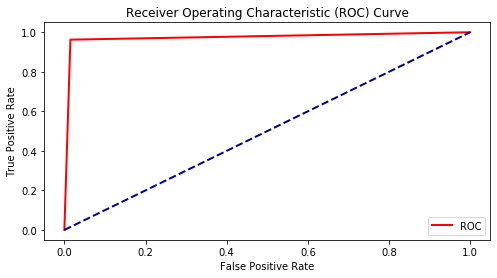

In [25]:
fpr, tpr, threshold = roc_curve(y_test_sm, y_pred_logreg)
construct_roc(fpr, tpr, threshold)

## Model 2: Näive Bayes

In [26]:
nb = GaussianNB()
nb.fit(X_train_sm, y_train_sm)

y_pred_nb = nb.predict(X_test_sm)
y_pred_prob_nb = nb.predict_proba(X_test_sm)[:, -1]

tags = ['0', '1']

print('accuracy %s' % accuracy_score(y_pred_nb, y_test_sm))
print(classification_report(y_test_sm, y_pred_nb,target_names=tags))
print(confusion_matrix(y_test_sm,y_pred_nb))


accuracy 0.8666971492886412
              precision    recall  f1-score   support

           0       0.79      0.99      0.88    113646
           1       0.99      0.74      0.85    113806

    accuracy                           0.87    227452
   macro avg       0.89      0.87      0.86    227452
weighted avg       0.89      0.87      0.86    227452

[[112667    979]
 [ 29341  84465]]


The Näive Bayes model did worse than Logistic regression, in terms of overall accuracy. The reason for this may be due to the following reasons: 
1. Most data in the dataset is numeric, while Näive Bayes tends to work better with continuous data.
2. Naive Bayes performs its best when there is an assumption of independence between the independent variables - which we don't know is the case for this dataset. (NOTE: Although the V-variables showed zero correlation, this does not necessarily imply that they are independent. Zero correlation simply shows that there is not significant **linear** relationship between the variables. 

While the accuracy of correctly classifying fraudulent transactions is quite high, the number of non-fraudulent data classified as fraudulent is quite high as well (false positive).\
However, in the context of classifying fraudulent transactions, the aim should be to decrease the **false negative** rate. i.e. the number of transactions classified as non-fraudulent when they actually are. The cost of incorrectly classifying a fraudulent transaction as non-fraudulent is much higher than classifying a non-fraudulent transaction as fraudulent (i.e. false negative much more expensive than false positive).

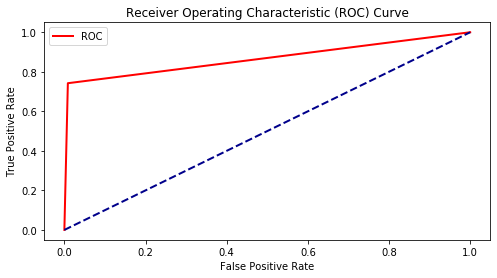

In [27]:
fpr, tpr, threshold = roc_curve(y_test_sm, y_pred_nb)
construct_roc(fpr, tpr, threshold)

## Model 3: Decision Tree

In [56]:
dt = DecisionTreeClassifier()
dt.fit(X_train_sm, y_train_sm)

y_pred_dt = dt.predict(X_test_sm)
y_pred_prob_dt = dt.predict_proba(X_test_sm)[:, -1]

tags = ['0', '1']

print('accuracy %s' % accuracy_score(y_pred_dt, y_test_sm))
print(classification_report(y_pred_dt, y_pred_nb,target_names=tags))
print(confusion_matrix(y_pred_dt,y_pred_nb))


accuracy 0.9979907848688954
              precision    recall  f1-score   support

           0       0.79      0.99      0.88    113487
           1       0.99      0.74      0.85    113965

    accuracy                           0.87    227452
   macro avg       0.89      0.87      0.86    227452
weighted avg       0.89      0.87      0.86    227452

[[112526    961]
 [ 29482  84483]]


Just as in the Näive Bayes, the accuracy of predictions for non-fraudulent cases is lower than the predictions for fraudulent cases. The results are almost identical to the Näive Bayes classifier.

The decision tree above can be visualised. Additional installations of graphviz and pydotplus needs to be done as show below. The required imports are shown at the top of the code with the other import statements.

In [57]:
# create a series containing only the features (excluding class column)

feature_col_df = pd.DataFrame()
feature_col_df = df.drop(columns = ['Class'])
feature_cols = feature_col_df.columns
feature_cols = feature_cols.to_series()

In [58]:
dot_data = StringIO()
export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('fraud.png')
Image(graph.create_png())

In [42]:
# uncomment to install the required libraries

# %pip install graphviz
# %pip install pydotplus

### Optimisation of Decision Tree

I will try to improve the accuracy of the decision tree by modifying the classifier.

In [52]:
dt = DecisionTreeClassifier(criterion="entropy", max_depth=4)
dt.fit(X_train_sm, y_train_sm)

y_pred_dt = dt.predict(X_test_sm)
y_pred_prob_dt = dt.predict_proba(X_test_sm)[:, -1]

tags = ['0', '1']

print('accuracy %s' % accuracy_score(y_pred_dt, y_test_sm))
print(classification_report(y_pred_dt, y_pred_nb,target_names=tags))
print(confusion_matrix(y_pred_dt,y_pred_nb))

accuracy 0.9625635298876246
              precision    recall  f1-score   support

           0       0.83      0.99      0.90    119289
           1       0.98      0.78      0.87    108163

    accuracy                           0.89    227452
   macro avg       0.91      0.88      0.88    227452
weighted avg       0.90      0.89      0.88    227452

[[117689   1600]
 [ 24319  83844]]


The default 'criterion' for deciding the feature to split on is 'Gini' by default. Instead of this, I decided to split based on entropy - which feature should the tree be initially split on, in order for us to get the most **information gain**.\
\
As seen from the classification report, both the accuracy of prediction of non-fraudulent data and recall for fraudulent data has increase by ~4%. There are around 5000 more correctly classified non-fraudulent transactions.\
The overall accuracy has decreased, but this is not a good indicator of how good the model is as I believe the previous model had more bias, which is why the accuracy was so high.

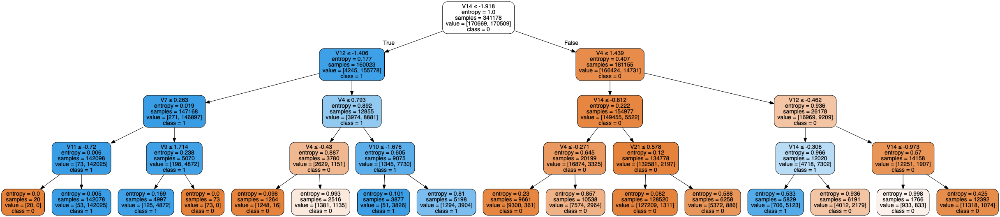

In [55]:
dot_data = StringIO()
export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('fraud_opt.png')
Image(graph.create_png())

This tree looks much cleaner and is easier to read - without taking a hit on the accuracy!

The first split of the decision tree above is on the variable V14, indicating that this is the most important feature for classification, and the one that provides us with the most imformation gain in determining the classification.

## Predicting real data

Now it is possible to run the prediction on a random row in the data (2nd row), and get the classification.

In [85]:
example_data_nonfraud = df.iloc[2, 0:30]
print("Logistic Regression: " + str(logreg.predict([example_data_nonfraud])) + " probability: " + \
      str(logreg.predict_proba([example_data_nonfraud])))
print("Näive Bayes: " + str(nb.predict([example_data_nonfraud])) + " probability: " +\
      str(nb.predict_proba([example_data_nonfraud])))
print("Decision Tree: " + str(dt.predict([example_data_nonfraud])) + " probability: " +\
      str(dt.predict_proba([example_data_nonfraud])))


Logistic Regression: [0] probability: [[0.97978632 0.02021368]]
Näive Bayes: [0] probability: [[9.99999999e-01 1.01318211e-09]]
Decision Tree: [0] probability: [[1. 0.]]


The above is a classification of a transaction which is known to be non-fraudulent. All classifiers accurately classify the transaction.

In [86]:
example_data_fraud = df.iloc[4920, 0:30]
print("Logistic Regression: " + str(logreg.predict([example_data_fraud])) + \
    str(logreg.predict_proba([example_data_fraud])))
print("Näive Bayes: " + str(nb.predict([example_data_fraud])) + str(nb.predict_proba([example_data_fraud])))
print("Decision Tree: " + str(dt.predict([example_data_fraud])) + str(dt.predict_proba([example_data_fraud])))

Logistic Regression: [1][[7.59295071e-10 9.99999999e-01]]
Näive Bayes: [0][[0.95690394 0.04309606]]
Decision Tree: [1][[0. 1.]]


The above is a classification of a transaction which is known to be fraudulent. The Logistic Regression classifier and Decision Tree correctly classify it as a fraudulent transaction, whereas Näive Bayes does not. It predicts, with high confidence (95.7%), that it is not a fraudulent transaction.

## Conclusion and Future Work

Logistic Regression was the best model, followed by Decision Tree, which had a higher accuracy rate for classifying fraudulent transactions and recall rate for non-fradulent transactions compared to Näive Bayes.

In the future, I will work on more models, such as LinearSVC, KNN and SGD. I would also like to have a comprehensive ranking for the features most important to classifying transactions as being fraudulent or not.